In [66]:
import pandas as pd
import geopandas as gpd
from geopandas import GeoDataFrame, read_file
from shapely.geometry import Point, LineString, Polygon
from datetime import datetime, timedelta
import movingpandas as mpd
import contextily as ctx
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

matplotlib.rcParams['animation.embed_limit'] = 2**128

print(mpd.__version__)

0.7.rc1


In [5]:
# Retrieve receiver array positions
receivers_gdf = pd.read_csv('VPS-Station-Locations.csv')
receivers_gdf = gpd.GeoDataFrame(receivers_gdf[['Station']], geometry=gpd.points_from_xy(receivers_gdf.Lng, receivers_gdf.Lat))
receivers_gdf = receivers_gdf.set_crs('EPSG:4326')

In [6]:
# Set the filename
filename = 'SharkArray-01.csv'

# Convert CSV to GeoDataFrame
shark_gdf = pd.read_csv(filename)
shark_gdf['t'] = pd.to_datetime(shark_gdf['DATETIME'])
shark_gdf = gpd.GeoDataFrame(shark_gdf[['TRANSMITTER', 't']], geometry=gpd.points_from_xy(shark_gdf.LON, shark_gdf.LAT))
shark_gdf = shark_gdf.set_crs('EPSG:4326')
shark_gdf = shark_gdf.set_index('t').tz_localize(None)

In [7]:
print('The dataset contains', shark_gdf.shape[0], 'rows and', shark_gdf.shape[1], 'columns.')
print('The column names are:', list(shark_gdf.columns.values))

The dataset contains 182985 rows and 2 columns.
The column names are: ['TRANSMITTER', 'geometry']


In [8]:
traj_collection = mpd.TrajectoryCollection(shark_gdf, 'TRANSMITTER')
print(traj_collection)

TrajectoryCollection with 32 trajectories


In [41]:
# Function to get string representing a trajectory's start and end times
def start_to_end(traj):
    return str(traj.get_start_time()) + ' to ' + str(traj.get_end_time())

# Returns whether or not a time falls between a trajectory's start and end time
def traj_contains_time(traj, time):
    return traj.get_start_time() <= time <= traj.get_end_time()

# Get xlim and ylim based on the bounding box around a trajectory, padded by some percentage
def get_lims(traj, xlim=None, ylim=None, padding=1):
    if xlim == None or ylim == None:
        # Retrieve trajectory bounds
        minx, miny, maxx, maxy = traj.get_bbox()
        if xlim == None:
            xlim = (minx, maxx)
        if ylim == None:
            ylim = (miny, maxy)

    if padding != 1:
        width = (xlim[1] - xlim[0]) * padding
        height = (ylim[1] - ylim[0]) * padding
        centerx = sum(xlim) / 2
        centery = sum(ylim) / 2
        xlim = (centerx - width / 2, centerx + width / 2)
        ylim = (centery - width / 2, centery + width / 2)
    return xlim, ylim

# Function to plot a collection of trajectories on the same axes
def plot_trajs(traj_col, title=None, legend=False, xlim=None, ylim=None, padding=1, rep_traj=None, figsize=(9, 5), plot_rc=True):
    if rep_traj == None:
        rep_traj = traj_col.trajectories[0]
    cmap = plt.get_cmap('jet')
    N = len(traj_col.trajectories)
    xlim, ylim = get_lims(rep_traj, xlim=xlim, ylim=ylim, padding=padding)
    
    # Create figure
    fig, ax = plt.subplots(figsize=figsize)
    
    # Plot and label each trajectory
    for i, traj in enumerate(traj_col.trajectories):
        color = cmap(float(i) / N)
        label = start_to_end(traj)
        traj.plot(ax=ax, linewidth=5, capstyle='round', label=label, color=color)
    
    # Plot receiver positions
    if plot_rc:
        receivers_gdf.plot(ax=ax)
    
    # Set up axes
    if legend:
        ax.legend()
    ax.set_xlim(xlim)
    ax.set_ylim(ylim)
    
    # Download map tiles and use them as a background image
    west, south, east, north = (xlim[0], ylim[0], xlim[1], ylim[1])
    ctx.add_basemap(ax, crs=rep_traj.crs.to_string(), source=ctx.providers.Stamen.Terrain)
    
    plt.title(title)
    plt.show()

# Animate a collection of trajectories
def animate_trajectories(trajectories, num_frames=100, start_time=None, end_time=None, xlim=None, ylim=None, padding=1, interval=20, rep_traj=None, figsize=(9, 9), plot_rc=True):
    # Populate keyword arguments if necessary
    if rep_traj == None:
        rep_traj = trajectories[0]
    if start_time == None:
        start_time = rep_traj.get_start_time()
    if end_time == None:
        end_time = rep_traj.get_end_time()
    duration = end_time - start_time
    xlim, ylim = get_lims(rep_traj, xlim=xlim, ylim=ylim, padding=padding)
    N = len(trajectories)
    cmap = plt.get_cmap('jet')
    
    # Create figure
    fig, ax = plt.subplots(figsize=figsize)
    title = ax.text(sum(xlim) / 2, ylim[1] - ((ylim[1] - ylim[0]) / 100), "", horizontalalignment='center', verticalalignment='top')
    positions = []
    paths = []
    paths_data = []
    for i, traj in enumerate(trajectories):
        color = cmap(float(i) / N)
        positions.append(ax.plot([], [], linestyle='None', color=color, marker='o', label=traj.df['TRANSMITTER'][0])[0])
        paths.append(ax.plot([], [], linestyle='-', color=color, marker=',')[0])
        paths_data.append(([], []))
    
    # Set up axes
    ax.legend()
    ax.set_xlim(xlim)
    ax.set_ylim(ylim)
    
    # Download map tiles and use them as a background image
    west, south, east, north = (xlim[0], ylim[0], xlim[1], ylim[1])
    ctx.add_basemap(ax, crs=rep_traj.crs.to_string(), source=ctx.providers.Stamen.Terrain)
    
    def init():
        # Plot receiver positions
        if plot_rc:
            receivers_gdf.plot(ax=ax)
        return (title, *tuple(positions), *tuple(paths))
    
    def update(frame):
        frame_time = start_time + (duration * frame / num_frames)
        for traj, position, path, path_data in zip(trajectories, positions, paths, paths_data):
            if traj_contains_time(traj, frame_time):
                point = traj.get_position_at(frame_time)
                x, y = point.coords[0]
                position.set_data([x], [y])
                path_data_x, path_data_y = path_data
                path_data_x.append(x)
                path_data_y.append(y)
                path.set_data(path_data_x[-5:], path_data_y[-5:])
        title.set_text(frame_time)
        return (title, *tuple(positions), *tuple(paths))
    
    return FuncAnimation(fig, update, frames=range(0, num_frames), init_func=init, blit=True, interval=interval, repeat=False)

Trajectory duration is 105 days, 21:42:00
Num points is 16316


<AxesSubplot:>

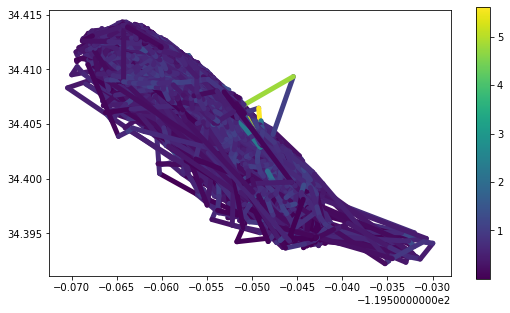

In [10]:
traj = traj_collection.filter('TRANSMITTER', ['2020-20']).trajectories[0]
print("Trajectory duration is", traj.get_duration())
print("Num points is", traj.df.shape[0])
traj.plot(column='speed', linewidth=5, capstyle='round', figsize=(9, 5), legend=True)

In [11]:
# Split shark trajectory by observation gap
day_trajs = mpd.TemporalSplitter(traj).split(mode='day')
print(day_trajs)

TrajectoryCollection with 105 trajectories


Num points is 194


Text(0.5, 1.0, '2020-05-21 16:33:00 to 2020-05-21 23:59:00')

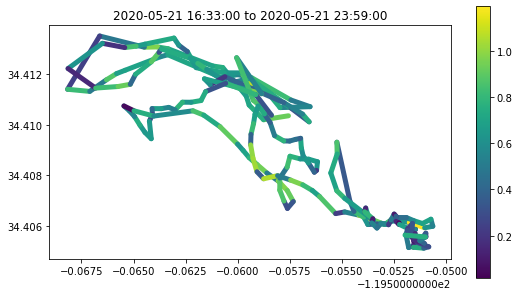

In [12]:
# Retrieve trajectory from a single day
day_traj = day_trajs.trajectories[0]
print("Num points is", day_traj.df.shape[0])
day_traj.plot(column='speed', linewidth=5, capstyle='round', figsize=(9, 5), legend=True)
plt.title(start_to_end(day_traj))

In [13]:
obs_gap_trajs = mpd.ObservationGapSplitter(day_traj).split(gap=timedelta(minutes=15))
print(obs_gap_trajs)

TrajectoryCollection with 4 trajectories


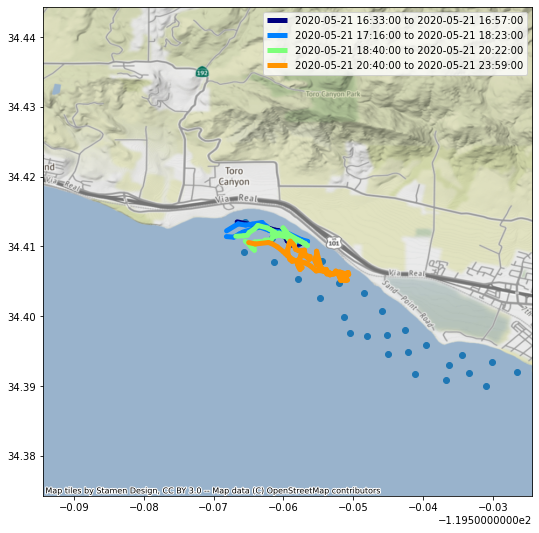

In [14]:
plot_trajs(obs_gap_trajs, legend=True, rep_traj=day_traj, padding=4, figsize=(9, 9))

In [36]:
stop_trajs = mpd.StopSplitter(day_traj).split(max_diameter=10, min_duration=timedelta(seconds=60))
print(stop_trajs)

TypeError: _split_traj() got an unexpected keyword argument 'rep_traj'

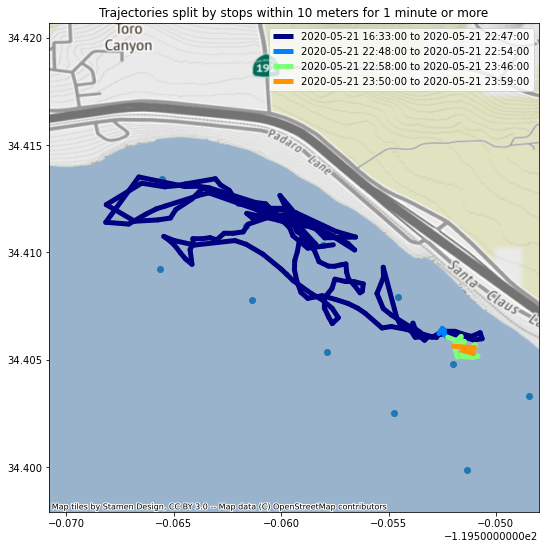

In [18]:
plot_trajs(stop_trajs, title='Trajectories split by stops within 10 meters for 1 minute or more', legend=True, rep_traj=day_traj, padding=1.3, figsize=(9, 9))

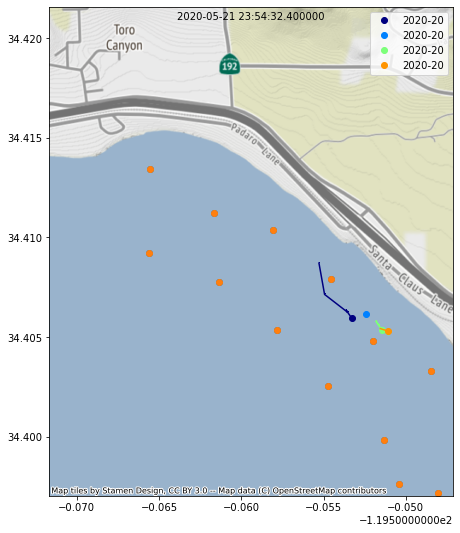

In [42]:
# Animate the day trajectory
ani = animate_trajectories(day_traj, num_frames=100, interval=100, padding=1.4, rep_traj=day_traj)
HTML(ani.to_jshtml())

In [34]:
ani.save('./animations/shark_2020-20_day_2020_5_21_receivers.gif', fps=10)

MovieWriter ffmpeg unavailable; using Pillow instead.


<Figure size 432x288 with 0 Axes>

In [52]:
# Split the trajectories of all sharks by day
day_trajs_dict = {}

for traj in traj_collection.trajectories:
    idx = traj.df['TRANSMITTER'][0]
    day_trajs_dict[idx] = mpd.TemporalSplitter(traj).split(mode='day')

{'2020-04': TrajectoryCollection with 13 trajectories, '2020-10': TrajectoryCollection with 70 trajectories, '2020-12': TrajectoryCollection with 113 trajectories, '2020-13': TrajectoryCollection with 37 trajectories, '2020-15': TrajectoryCollection with 111 trajectories, '2020-16': TrajectoryCollection with 112 trajectories, '2020-17': TrajectoryCollection with 96 trajectories, '2020-19': TrajectoryCollection with 100 trajectories, '2020-20': TrajectoryCollection with 105 trajectories, '2020-21': TrajectoryCollection with 105 trajectories, '2020-22': TrajectoryCollection with 91 trajectories, '2020-31': TrajectoryCollection with 9 trajectories, '2020-32': TrajectoryCollection with 41 trajectories, '2020-33': TrajectoryCollection with 36 trajectories, '2020-34': TrajectoryCollection with 17 trajectories, '2020-35': TrajectoryCollection with 3 trajectories, '2020-35_2': TrajectoryCollection with 36 trajectories, '2020-36': TrajectoryCollection with 36 trajectories, '2020-37': Trajectory

In [64]:
# Extract the trajectories of all sharks on 1 day
first_day_trajs = []
for _, d in day_trajs_dict.items():
    first_day_trajs.append(d.trajectories[0])

print(max([traj.get_start_time() for traj in first_day_trajs]))

2020-09-03 19:30:00


In [ ]:
# Animate the day trajectory
ani = animate_trajectories(first_day_trajs[:22], num_frames=600, interval=100, padding=4, start_time=datetime(2020, 5, 15, 16, 28, 0), end_time=datetime(2020, 5, 21, 23, 59, 0), rep_traj=day_traj)
HTML(ani.to_jshtml())